Pivoting to a hierarchical structure for a scene graph. This is motivated by the complexity of calculating GED for an arbitrary grpah - structuring it as a tree may yield better performance for similarity metric calculation.

# Setup

## Notebook Setup

Google Colab
- Google Colab secrets: add a Gemini API key as `GOOGLE_API_KEY`. May be pre-populated from a previous session.
    - Need to create an account for Gemini and grab a key there.

In [1]:
# assume run from the root of the repository
import os

try:
    if CONFIGURED_DIRS:
        pass
except:
    PLAYGROUND_DIR = os.getcwd()
    os.chdir("../..")

CONFIGURED_DIRS = True

print(f"Notebook directory: {PLAYGROUND_DIR}")
print(f"Working directory: {os.getcwd()}")

Notebook directory: c:\Users\emily\Documents\coursework\vip lab\kalman-filter-scene-graph\graph_distance\hierarchical_sg
Working directory: c:\Users\emily\Documents\coursework\vip lab\kalman-filter-scene-graph


In [2]:
from PIL import Image
import json
from common.draw_class import Drawer
from common.SceneGraphGenerator import SceneGraphGenerator
from common.video import get_zipnerf, extract_frames
from graph_distance.hierarchical_sg.util import simple_print, parse_tree

In [3]:
sgg = SceneGraphGenerator()

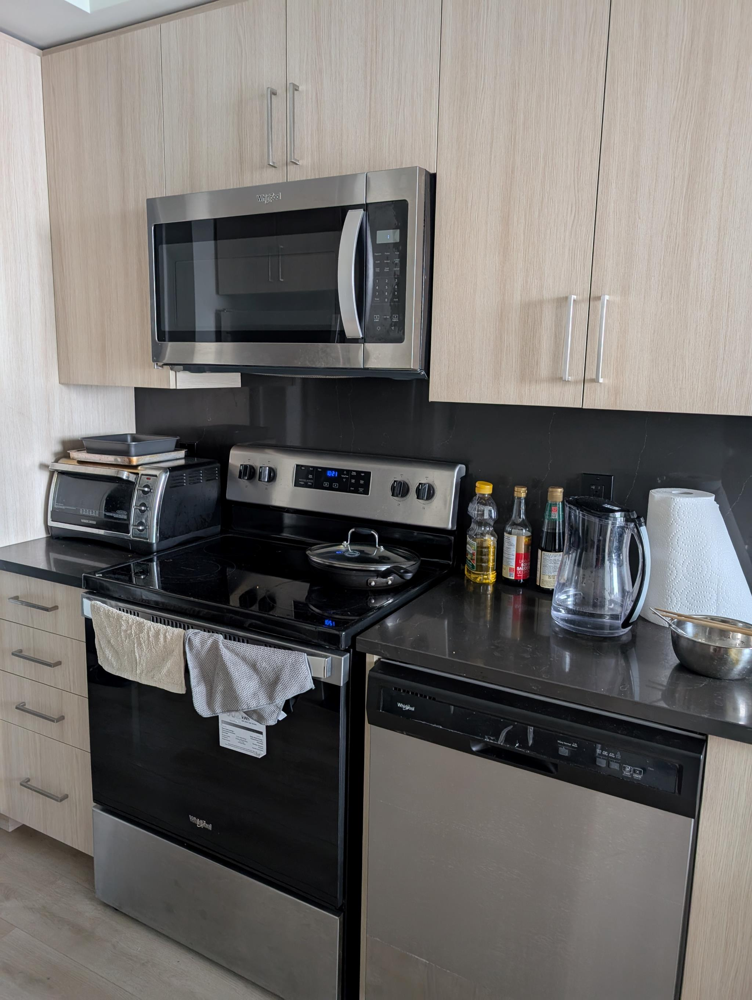

In [4]:
kitchen_portrait = Image.open("img/kitchen_portrait.jpg")
kitchen_portrait

## Grab video frames

In [5]:
zipnerf_video = get_zipnerf()
zipnerf_livingroom_time = [4, 10]
zipnerf_kitchen_time = [10, 12]

Video already available locally at img/zipnerf.mp4.


In [6]:
sample_frames = extract_frames(zipnerf_video, zipnerf_kitchen_time[0], 0.1, 3)
shortvid_frames = extract_frames(zipnerf_video, zipnerf_kitchen_time[0] - 1, 0.05, 60)

Frame rate: 60.0 FPS
Total frames: 1920
Frame rate: 60.0 FPS
Total frames: 1920


# Try generating a hierarchical scene graph

In [7]:
with open("graph_distance/hierarchical_sg/prompt.txt", "r") as f:
    prompt = f.read()

In [8]:
kitchen_portrait_graph = sgg.generate_scene_graph(kitchen_portrait, prompt)
kitchen_portrait_graph

{'id': 1,
 'name': 'kitchen',
 'bbox': [0, 0, 999, 999],
 'attributes': ['modern', 'clean'],
 'predicate': 'root',
 'children': [{'id': 2,
   'name': 'cabinets',
   'bbox': [0, 0, 386, 999],
   'attributes': ['light wood', 'wall-mounted'],
   'predicate': 'in',
   'children': [{'id': 3,
     'name': 'microwave',
     'bbox': [152, 186, 347, 576],
     'attributes': ['stainless steel', 'whirlpool'],
     'predicate': 'on',
     'children': []}]},
  {'id': 4,
   'name': 'countertop',
   'bbox': [386, 0, 684, 999],
   'attributes': ['dark gray', 'granite'],
   'predicate': 'in',
   'children': [{'id': 5,
     'name': 'toaster oven',
     'bbox': [445, 65, 541, 287],
     'attributes': ['black', 'black+decker'],
     'predicate': 'on',
     'children': []},
    {'id': 6,
     'name': 'range',
     'bbox': [445, 287, 684, 638],
     'attributes': ['stainless steel', 'whirlpool'],
     'predicate': 'on',
     'children': [{'id': 7,
       'name': 'cookware',
       'bbox': [541, 378, 601, 54

In [9]:
simple_print(kitchen_portrait_graph)

kitchen (1) root: ['modern', 'clean']
	cabinets (2) in: ['light wood', 'wall-mounted']
		microwave (3) on: ['stainless steel', 'whirlpool']
	countertop (4) in: ['dark gray', 'granite']
		toaster oven (5) on: ['black', 'black+decker']
		range (6) on: ['stainless steel', 'whirlpool']
			cookware (7) on: ['black', 'metal']
		condiments (8) on: ['bottles', 'various']
		pitcher (9) on: ['clear', 'plastic']
		paper towels (10) on: ['white', 'roll']
		bowl (11) on: ['metal', 'silver']
	oven (12) on: ['whirlpool', 'stainless steel']
	dishwasher (13) on: ['stainless steel', 'whirlpool']
	drawers (14) in: ['light wood']


In [10]:
objects, relationships = parse_tree(kitchen_portrait_graph)

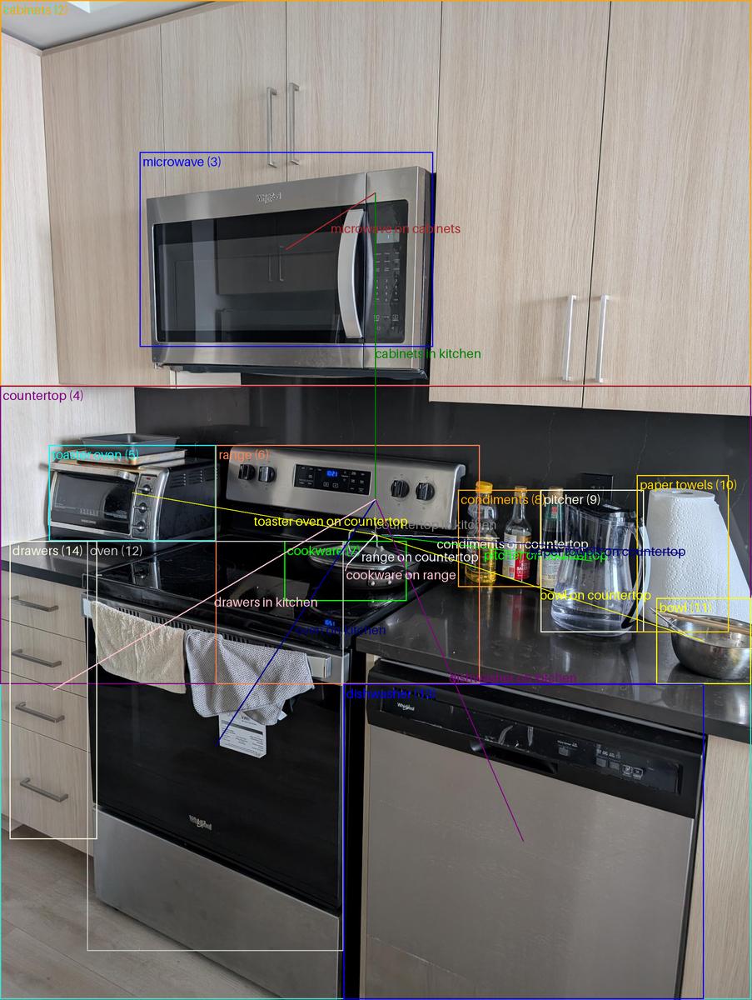

In [11]:
draw = Drawer(kitchen_portrait)

draw.add_objects(objects)
draw.add_relationships(relationships)

draw.draw()
draw.show()

# Tree Edit Distance

In [13]:
from graph_distance.hierarchical_sg.tree_edit_distance import tree_edit_distance

In [16]:
sample_graphs = []
for frame in sample_frames:
    sample_graph = sgg.generate_scene_graph(frame, prompt)
    sample_graphs.append(sample_graph)
    simple_print(sample_graph)

room (1) root: []
	kitchen_counter (2) in: ['brown']
		electronic_device (3) on: []
		cup (4) on: ['yellow']
	table (5) in: ['wooden', 'round']
		plate (6) on: []
		drinking_glass (7) on: ['pink']
		drinking_glass (8) on: ['blue']
		bottle (9) on: ['blue']
		chair (10) on: ['wooden']
		chair (11) on: ['wooden']
		chair (12) on: ['wooden']
	window (13) in: ['white']
		blinds (14) on: ['white']
	shelf (15) in: ['wooden']
room (1) root: []
	window (2) in: ['white']
		blinds (3) on: ['white']
	kitchen_counter (4) in: ['beige']
		cutting_board (5) on: ['white']
		mug (6) on: ['white']
	dining_table (7) in: ['brown']
		chair (8) on: ['brown']
		chair (9) on: ['brown']
		chair (10) on: ['brown']
		cup (11) on: ['blue']
		cup (12) on: ['red']
	shelf (13) in: ['brown']
	step_stool (14) in: ['white']
kitchen (1) root: ['indoor']
	countertop (2) in: ['brown']
		laptop (3) on: ['silver']
		kitchen_sink (4) on: ['white']
	dining_table (5) in: ['wooden']
		chair (6) on: ['wooden']
		chair (7) on: ['

In [17]:
print(tree_edit_distance(sample_graphs[0], sample_graphs[1]))
print(tree_edit_distance(sample_graphs[1], sample_graphs[2]))

16.0
14.0


# Another measure